# *Required Libraries:*

In [1]:
%pip install imutils

Note: you may need to restart the kernel to use updated packages.


In [2]:
# General purpose libraries
import pandas as pd
import numpy as np
import os
import sys
import imutils
import itertools
import shutil
import random 
from collections import  Counter

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Sklearn libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix

# OpenCv libraries
import cv2
from PIL import Image

# Tensorflow libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50,ResNet152
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model


# *Data Preparation:*

We have MRI scaned images of four types of human brain tumors. The given dataset has two part as training and testing, it may possible that the given separation  be biased with respect to client , so we gathered all the images as a single image file with respectives labels and we will split these images into test and train set randomly before train a model.

In [3]:
# Image labels
img_labels = ['glioma','meningioma','notumor','pituitary']

# Train & directory
train_dir = "/kaggle/input/brain-tumor-mri-dataset/Training"
test_dir  = "/kaggle/input/brain-tumor-mri-dataset/Testing"

# Initialize inputs and target/labels list
X_Images = []
Y_Labels = []

# To find the images height, weidth and their pixel values information
pixel_min = float('inf')
pixel_max = float('-inf')

height_min = float('inf')
height_max = float('-inf')

weidth_min = float('inf')
weidth_max = float('-inf')

# Read all images from both the directories and
# store them with their respective labels
for dir in [train_dir, test_dir]:
    # dir is the current directory
    for lab in img_labels:
        # for each labels the folder path is:
        folder_path = os.path.join(dir, lab)
        # for current folder in current directory, images are:
        for img in os.listdir(folder_path):
            # image path:
            img_path = os.path.join(folder_path, img)
            # Read current image using opencv cv2
            image = cv2.imread(img_path)  
            # if we did not read invalid image file
            if image is not None:
                # updates pixels min and max
                pixel_max = max(pixel_max, image.max())
                pixel_min = min(pixel_min, image.min())

                # Updates image heights and weidths
                height_max = max(height_max, image.shape[0])
                height_min = min(height_min, image.shape[0])

                weidth_max = max(weidth_max, image.shape[1])
                weidth_min = min(weidth_min, image.shape[1])

                # Update the image and labels list
                X_Images.append(image)
                Y_Labels.append(lab)
            else:
                print('Invalid Image!')


# Succeful message
print("Data reading done.....")

Data reading done.....


In [4]:
#print the pixels information
print(f'Maximum pixel value: {pixel_max}')
print(f'Minimum pixel value: {pixel_min}')

# Print the image height and weidth informations
print(f'Maximum height value: {height_max}')
print(f'Minimum height value: {height_min}')

print(f'Maximum weidth value: {weidth_max}')
print(f'Minimum weidth value: {weidth_min}')

Maximum pixel value: 255
Minimum pixel value: 0
Maximum height value: 1446
Minimum height value: 168
Maximum weidth value: 1920
Minimum weidth value: 150


In [5]:
# Shuffles the images and their respective labels

# for better generalization
np.random.seed(101)
# Shuffle both arrays in unison using a common random seed
indices = np.arange(len(X_Images))  # list of indices
np.random.shuffle(indices)   # shuffle the indices
# shuffling the images and its labels
X_images = [X_Images[idx] for idx in indices]
Y_labels = [Y_Labels[idx] for idx in indices]

# Succesful messages
print("Reshaping and numpy array conversion and shuffling has done!")

Reshaping and numpy array conversion and shuffling has done!


# *Image PreProcessing Part:*

# *Visulalize some of images and corresponding labels:*

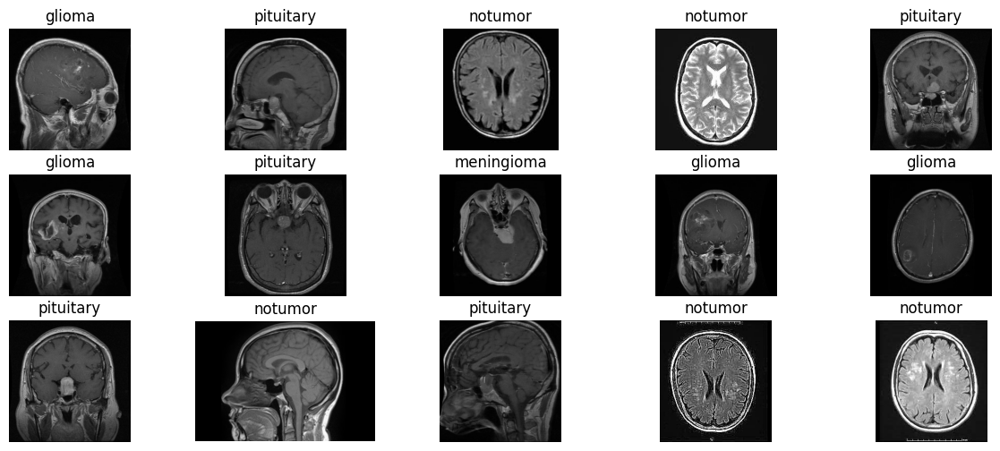

In [6]:
num_img = 15
# Create a 2x5 grid for subplots (2 rows, 5 columns)
plt.figure(figsize=(15, 6))
# Randomly select 15 numbers from 0 to 7022
random_numbers = random.sample(range(7023), 15)
for i in range(num_img):
    # Set the position of each subplot, using i + 1 for the index
    plt.subplot(num_img//5, 5, i+1)  # 3 rows, 5 columns, position i+1
    plt.imshow(X_images[random_numbers[i]], cmap='gray')  # Display the image
    plt.title(f'{Y_labels[random_numbers[i]]}')  # Set the title with the label
    plt.axis('off')  # Hide axis ticks and labels

plt.show()

# Crop The Images To Remove Unnecessary Region:

In [7]:
# Function  to crop an image
def Crop_image(img):
    """
    Finds the extreme points on the image and crops the rectangular out of them
    """
    # Copy from original image
    img = img.copy()
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) # RGB to GRAY conversion
    # Smoothing images while preserving edges
    gray_img = cv2.GaussianBlur(gray_img, (3,3), 0)

    # Thresholding the image to remove unnecessary pixels, 
    # then perfom a series of erosions +
    # dilations to remove any samll region of noise while preseving
    # important features in the images
    _,img_thresh = cv2.threshold(gray_img, 45, 255, cv2.THRESH_BINARY)
    img_erode = cv2.erode(img_thresh, None, iterations=2)
    img_dilate = cv2.dilate(img_erode, None, iterations=2)

    # Find contours in thresholded image, then grab the largest one
    cnts = cv2.findContours(img_dilate.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    c = max(cnts, key=cv2.contourArea)

    # Find the extreme points
    extLeft = tuple( c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])

    # Add contour on the image
    img_cnt = cv2.drawContours(img.copy(), [c], -1, (0, 255, 255), 4)

    # Add extreme points
    img_pnt = cv2.circle(img_cnt.copy(), extLeft, 8, (0,0,255),-1)
    img_pnt = cv2.circle(img_pnt, extRight, 8, (0,255,0),-1)
    img_pnt = cv2.circle(img_pnt, extTop, 8, (255,0,0),-1)
    img_pnt = cv2.circle(img_pnt, extBot, 8, (255,0,0),-1)
    # Crop 
    Add_pixel = 0
    img_crop = img[extTop[1]-Add_pixel:extBot[1]+Add_pixel, extLeft[0]-Add_pixel:extRight[0]+Add_pixel].copy()
    return img_cnt, img_pnt, img_crop # contourd image, image with extreme points, croped image

### Example:

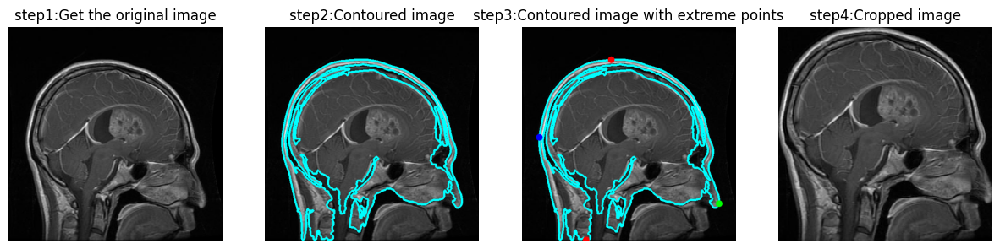

In [8]:
# img = cv2.imread("/kaggle/input/brain-tumor-mri-dataset/Training/meningioma/Tr-meTr_0000.jpg")
img = X_Images[2]
img_cnt, img_pnt, img_crop = Crop_image(img)
img_crop = cv2.resize(img_crop, dsize=(224,224), interpolation=cv2.INTER_LANCZOS4)
plt.figure(figsize=(15,10))
plt.subplot(141)
plt.imshow(img)
plt.title('step1:Get the original image')
plt.axis('off')
plt.subplot(142)
plt.imshow(img_cnt)
plt.title('step2:Contoured image')
plt.axis('off')
plt.subplot(143)
plt.imshow(img_pnt)
plt.title('step3:Contoured image with extreme points')
plt.axis('off')
plt.subplot(144)
plt.imshow(img_crop)
plt.title('step4:Cropped image')
plt.axis('off')
plt.show()

In [9]:
img.shape,img_cnt.shape, img_crop.shape

((512, 512, 3), (512, 512, 3), (224, 224, 3))

# Apply Crop formula on original images and resizing them:

In [10]:
X_crops = []
for img in X_images:
    # crop the current image
    _,_, img_crop = Crop_image(img)
    # resize it
    img_crop = cv2.resize(img_crop, dsize=(224,224), interpolation=cv2.INTER_LANCZOS4)
    # append into new list
    X_crops.append(img_crop)

print('Crop on original version has been done!')

Crop on original version has been done!


### Visualize Some Croped Images:

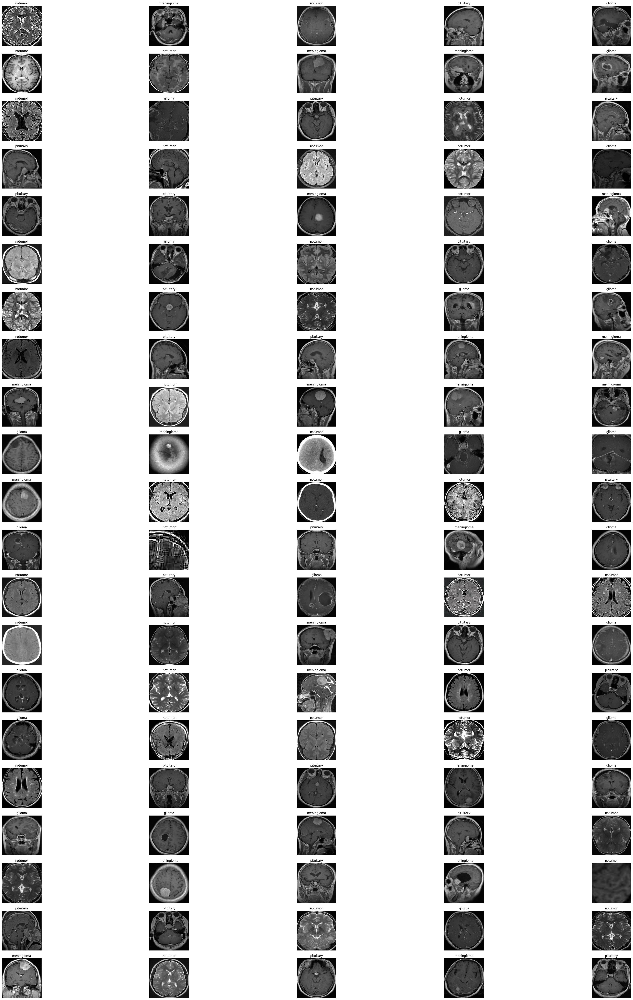

In [11]:
num_img = 105
# Create a 2x5 grid for subplots (2 rows, 5 columns)
plt.figure(figsize=(50, 70))
# Randomly select 15 numbers from 0 to 7022
random_numbers = random.sample(range(7023), 105)
for i in range(num_img):
    # Set the position of each subplot, using i + 1 for the index
    plt.subplot(num_img//5, 5, i+1)  # 3 rows, 5 columns, position i+1
    plt.imshow(X_crops[random_numbers[i]], cmap='gray')  # Display the image
    plt.title(f'{Y_labels[random_numbers[i]]}')  # Set the title with the label
    plt.axis('off')  # Hide axis ticks and labels

plt.show()

### Removing noise and Apply colormap bone:

In [12]:
X_dnoise = []
for img in X_crops:
    dnoise_img = cv2.bilateralFilter(img, 2, 50,50)
    # apply colormap bone for highlight important features
    cmap_img = cv2.applyColorMap(dnoise_img, cv2.COLORMAP_BONE)
    X_dnoise.append(cmap_img)
print('Denoising has done!')

Denoising has done!


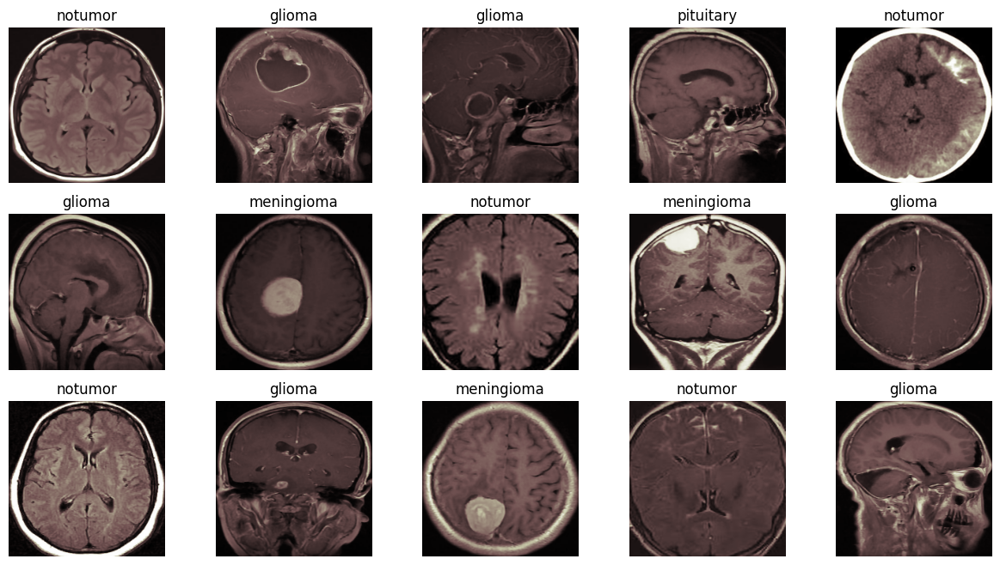

In [13]:
num_img = 15
# Create a 2x5 grid for subplots (2 rows, 5 columns)
plt.figure(figsize=(15, 8))
# Randomly select 15 numbers from 0 to 7022
random_numbers = random.sample(range(7023), 15)
for i in range(num_img):
    # Set the position of each subplot, using i + 1 for the index
    plt.subplot(num_img//5, 5, i+1)  # 3 rows, 5 columns, position i+1
    plt.imshow(X_dnoise[random_numbers[i]], cmap='gray')  # Display the image
    plt.title(f'{Y_labels[random_numbers[i]]}')  # Set the title with the label
    plt.axis('off')  # Hide axis ticks and labels

plt.show()

# *Normalized each images:*

In [14]:
X_nimages = []
for img in X_dnoise:
    norm_img = (img/255.0).astype('float32')
    X_nimages.append(norm_img)
# Successful msg
print('Normalized has done!')

Normalized has done!


# *Brain Tumor Distribution:*

In [15]:
# Convert all the list into np array
X_nimages = np.array(X_nimages)
Y_labels = np.array(Y_labels)

In [16]:
# Counts for each types of tumor:
pd.DataFrame(list(Counter(Y_labels).items()), columns=['Class', 'Count'])

,Class,Count
0,glioma,1621
1,pituitary,1757
2,notumor,2000
3,meningioma,1645


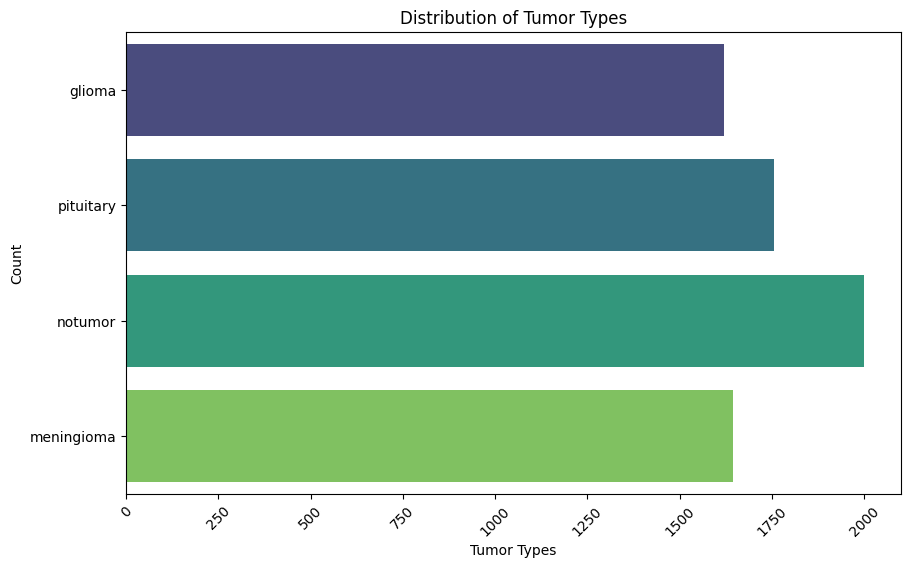

In [17]:
#Plot using Seaborn's countplot with 'viridis' palette
plt.figure(figsize=(10, 6))
sns.countplot(y=Y_labels, palette='viridis')  # Use data frame with hue
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
plt.xlabel('Tumor Types')  # Label for the x-axis
plt.ylabel('Count')  # Label for the y-axis
plt.title('Distribution of Tumor Types')  # Title of the plot
plt.show()

We have class imbalanced dataset. We need to handle it properly.

# *Splits the entire dataset into train and test randomly using stratified splitting:*

**Stratified splitting** ensures that the class distribution in our dataset is preserved across training and test sets. This is particularly important for imbalanced datasets to prevent over-representation or under-representation of certain classes during model evaluation. The split is performed based on the labels (target variable) so that the proportion of each class in the original dataset is reflected in both the train and test sets. In Python, this can be implemented using **stratify** in **train_test_split** from **sklearn**. It is especially useful in classification problems where maintaining class balance is crucial.

In [18]:
#stratified splitting
X_train, X_test, y_train, y_test = train_test_split(
    X_nimages, Y_labels, test_size=0.2, stratify=Y_labels, random_state=42
)

print('Spliting into 80-20 has done!')

Spliting into 80-20 has done!


,Class,Count
0,meningioma,1316
1,glioma,1297
2,notumor,1600
3,pituitary,1405


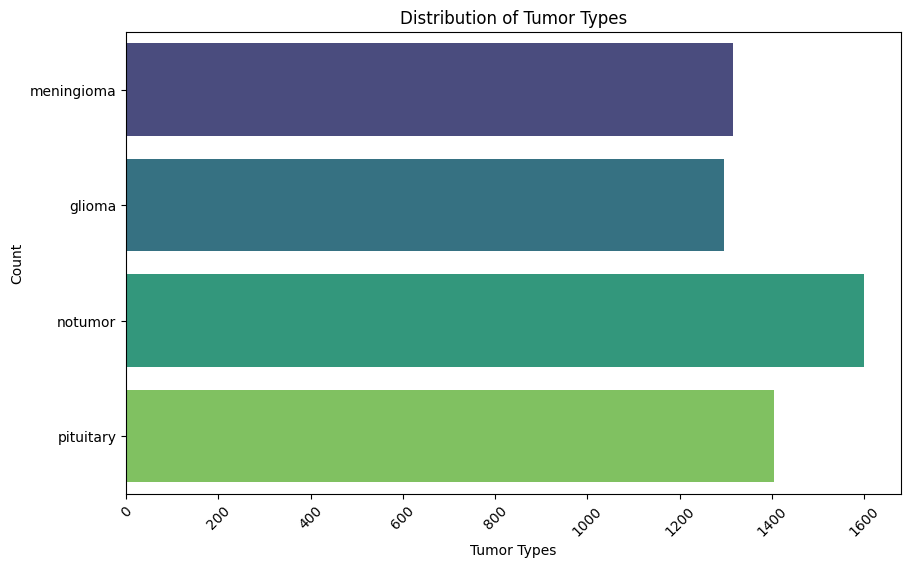

In [19]:
# Distribution of class in training set
display(pd.DataFrame(list(Counter( y_train).items()), columns=['Class', 'Count']))

# Barplots
#Plot using Seaborn's countplot with 'viridis' palette
plt.figure(figsize=(10, 6))
sns.countplot(y= y_train, palette='viridis')  # Use data frame with hue
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
plt.xlabel('Tumor Types')  # Label for the x-axis
plt.ylabel('Count')  # Label for the y-axis
plt.title('Distribution of Tumor Types')  # Title of the plot
plt.show()

### Data Augmentation on Training set:

In [20]:
# Get class distribution using Counter
class_distribution = Counter(y_train)

# Find the maximum samples among all classes for balancing
max_samples = max(class_distribution.values())

# Find the class with the maximum number of samples
major_class = max(class_distribution, key=class_distribution.get)

print(f"The class with the most samples is: {major_class} with {max_samples} samples.")

The class with the most samples is: notumor with 1600 samples.


In [21]:
class_distribution

Counter({'meningioma': 1316,
         'glioma': 1297,
         'notumor': 1600,
         'pituitary': 1405})

In [22]:
# Step 1: Calculate class counts
class_counts = {class_name[0]: class_name[1]  for class_name in class_distribution.items()}
print(class_counts)

{'meningioma': 1316, 'glioma': 1297, 'notumor': 1600, 'pituitary': 1405}


In [23]:
# Define ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True,
    fill_mode='nearest'
)
# Define class names
class_names = ['meningioma', 'glioma', 'notumor', 'pituitary']

# Step 1: Calculate class counts
class_counts = {class_name[0]: class_name[1]  for class_name in class_distribution.items()}

# Step 2: Loop through each class and augment if the class is a minority
augmented_images = []
augmented_labels = []

for class_name in class_names:
    # Step 2.1: Filter images for the current class
    class_images = [X_train[i] for i in range(len(y_train)) if y_train[i] == class_name]
    
    # Step 2.2: If the class is a minority class, perform augmentation
    if class_counts[class_name] < max_samples:
        num_images_to_select = max_samples - class_counts[class_name]  # How many images to augment
        # Randomly select images from the class to augment
        selected_images = random.sample(class_images, num_images_to_select)
        # Step 2.3: Augment selected images
        for img in selected_images:
            img = img_to_array(img) if not isinstance(img, np.ndarray) else img  # Convert to numpy array if not already
            img = img.reshape((1,) + img.shape)  # Reshape for grayscale (1, height, width, 3)
            
            # Generate one augmented image per original image
            for batch in datagen.flow(img, batch_size=1):
                augmented_image = batch[0].astype('float32')  # Convert back to float64 format
                augmented_images.append(augmented_image)  # Append the reshaped image
                augmented_labels.append(class_name)  # Append corresponding label
                break  # Only generate one augmented image per original image
        print(f"Augmented {num_images_to_select} images for the class {class_name}.")



Augmented 284 images for the class meningioma.
Augmented 303 images for the class glioma.
Augmented 195 images for the class pituitary.


### Visualize some augmented images:

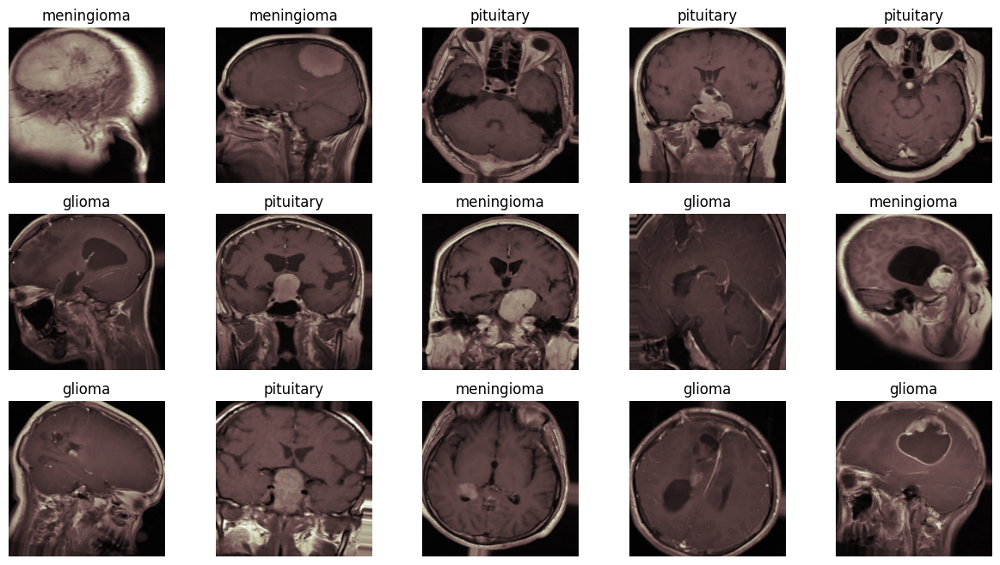

In [24]:
num_img = 15
# Create a 2x5 grid for subplots (2 rows, 5 columns)
plt.figure(figsize=(15, 8))
# Randomly select 15 numbers from 0 to 7022
random_numbers = random.sample(range(len(augmented_images)), 15)
for i in range(num_img):
    # Set the position of each subplot, using i + 1 for the index
    plt.subplot(num_img//5, 5, i+1)  # 3 rows, 5 columns, position i+1
    plt.imshow(augmented_images[random_numbers[i]])  # Display the image
    plt.title(f'{augmented_labels[random_numbers[i]]}')  # Set the title with the label
    plt.axis('off')  # Hide axis ticks and labels

plt.show()

In [25]:
# Add augmented images and labels to the dataset
X_train_augmented = np.concatenate((X_train, np.array(augmented_images)))
y_train_augmented = np.concatenate((y_train, np.array(augmented_labels)))
print(f"New dataset size: {len(X_train_augmented)} images, {len(y_train_augmented)} labels.")

# Shuffle then for better generalization
indices = np.arange(len(X_train_augmented))  # list of indices
np.random.shuffle(indices)
X_train_augmented = X_train_augmented[indices]
y_train_augmented = y_train_augmented[indices]
print('Shuffle has done!')

New dataset size: 6400 images, 6400 labels.
Shuffle has done!


,Class,Count
0,notumor,1600
1,glioma,1600
2,pituitary,1600
3,meningioma,1600


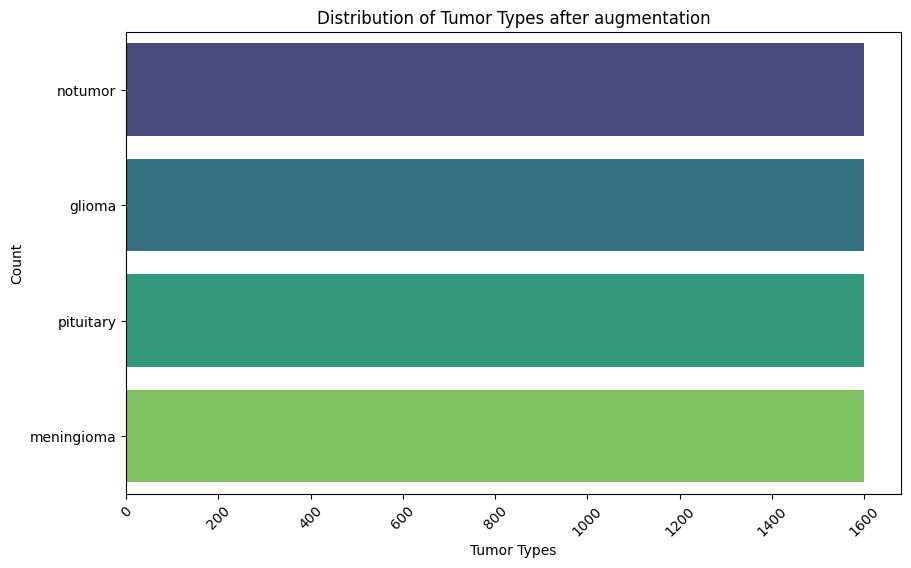

In [26]:
# Distribution of class in training set
display(pd.DataFrame(list(Counter( y_train_augmented).items()), columns=['Class', 'Count']))

# Barplots
#Plot using Seaborn's countplot with 'viridis' palette
plt.figure(figsize=(10, 6))
sns.countplot(y= y_train_augmented, palette='viridis')  # Use data frame with hue
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
plt.xlabel('Tumor Types')  # Label for the x-axis
plt.ylabel('Count')  # Label for the y-axis
plt.title('Distribution of Tumor Types after augmentation')  # Title of the plot
plt.show()

# Convert Train and Test labels into numeric values and then one-hot representation:

In [27]:
# Numerical conversion  usingsklearn LabelEncoder
# Label Encoding (convert string labels to integers)
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_augmented) # fit on train set
y_test_encoded = label_encoder.transform(y_test)  # use on test set

print("Encoded has done!")

Encoded has done!


In [28]:
# Get the mapping of original labels to encoded labels
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

print("Label mapping:", label_mapping)

Label mapping: {'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}


In [29]:
y_test

array(['meningioma', 'meningioma', 'glioma', ..., 'notumor', 'glioma',
       'pituitary'], dtype='<U10')

In [30]:
y_test_encoded

array([1, 1, 0, ..., 2, 0, 3])

In [31]:
# Integer label to One-hot conversion
y_train_one_hot = to_categorical(y_train_encoded, num_classes=len(label_encoder.classes_))
y_test_one_hot = to_categorical(y_test_encoded, num_classes=len(label_encoder.classes_))

print("One-hot conversion has done!")

One-hot conversion has done!


In [32]:
y_test_encoded

array([1, 1, 0, ..., 2, 0, 3])

In [33]:
y_test_one_hot

array([[0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 1., 0.],
       [1., 0., 0., 0.],
       [0., 0., 0., 1.]])

In [34]:
# Esure all the sets have same formate
print('Train image: ', type(X_train_augmented))
print('Train label: ', type(y_train_one_hot))
print('Test image: ',  type(X_test))
print('Train label: ', type(y_test_one_hot))

Train image:  <class 'numpy.ndarray'>
Train label:  <class 'numpy.ndarray'>
Test image:  <class 'numpy.ndarray'>
Train label:  <class 'numpy.ndarray'>


Thus   we have

1. training set as : **(X_train_augmented,  y_train_one_hot)**
2. test set as:  **(X_test,  y_test_one_hot)**


In [35]:
# Shapes of each sets
X_train_augmented.shape, y_train_one_hot.shape, X_test.shape, y_test_one_hot.shape 

((6400, 224, 224, 3), (6400, 4), (1405, 224, 224, 3), (1405, 4))

# Use Of Transfer Learning:


1. **Transfer Learning:** Transfer learning is a powerful technique in deep learning, where a model trained on one task is reused (with or without fine-tuning) for another, often similar, task. It leverages knowledge from a pre-trained model to improve performance and reduce training time, especially when the available data for the new task is limited.

2. **Transfer learning** typically uses pre-trained models that have been trained on large benchmark datasets, such as:


* **ImageNet** for image classification (models like VGG, ResNet, Inception, EfficientNet)
* **COCO** for object detection tasks
* **GLUE/SQuAD**
 for natural language processing tasks
These models have learned a variety of features (e.g., edges, textures, objects for image tasks) that can be beneficial for many other tasks.

**There are two main approaches to transfer learning:**


* a) **Fine-tuning (Feature Extraction + Fine-tuning):**
  
  **Feature Extraction:** You freeze the layers of a pre-trained model and use it as a fixed feature extractor. You only train a new classifier on top of the pre-trained model.Freezing layers: You freeze the layers of the pre-trained model so their weights are not updated during training. Only the weights of the new classifier layer are trained.

  **Fine-tuning:** You fine-tune some of the top layers of the pre-trained model, updating their weights, while keeping the lower layers frozen. This approach adapts the model to the specific new task by allowing for minor adjustments.

* b) **Full Model Fine-tuning:** You start with a pre-trained model, and you fine-tune all layers by unfreezing them and updating all the weights during training. This can be computationally expensive but can yield the best performance for tasks that are very different from the pre-trained model’s original task.


> Here we wish to use a pre-trained model, **ResNet152(Latest version of it)** without top layers and wish to freeze the features extraction layers (that is, freeze the Convolutional layers) and add our custome top dense layers for classification.

#  *Load the Base model ResNet152:*

In [36]:
!wget https://storage.googleapis.com/tensorflow/keras-applications/resnet/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5


--2025-02-23 17:29:40--  https://storage.googleapis.com/tensorflow/keras-applications/resnet/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.98.207, 172.253.117.207, 74.125.197.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.98.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 94765736 (90M) [application/octet-stream]
Saving to: ‘resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5’

resnet50_weights_tf 100%[===================>]  90.38M   262MB/s    in 0.3s    

2025-02-23 17:29:41 (262 MB/s) - ‘resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [94765736/94765736]



In [37]:
# Load the RestNet152 as base model with out top
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = True
    

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


# *Define the custome dense layers on top:*

In [38]:
# Custome Top Dense layers
# x = Flatten()(base_model.output)
x = GlobalAveragePooling2D()(base_model.output)
# x = BatchNormalization()(x)
# x = Dense(1024, activation='relu')(x)
# x = BatchNormalization()(x)
x = Dropout(0.4)(x)
output = Dense(4, activation='softmax')(x)  # Since our number of class is 4

In [39]:
# Create the final model
model = Model(inputs=base_model.input, outputs=output)

# Compiles the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
# model.summary()

In [40]:
# plot the model architecture:
# plot_model(model, to_file="Model_Architecture.png", show_shapes=True, show_layer_names=True)


# *Define the Callbacks:*

In [41]:
# Early stoping
# early_stop = EarlyStopping(monitor ='val_loss', patience=5, restore_best_weights=True,verbose=1)
reduce_lr = ReduceLROnPlateau(monitor ='val_loss', factor=0.3, patience=2, min_lr=1e-10,verbose=1)
    
# Add ModelCheckpoint to save the best model based on validation loss
model_checkpoint = ModelCheckpoint('Best_Model_On_Partial.keras', monitor='val_loss', save_best_only=True, mode='min', verbose=1) 

# *Training part:*

In [42]:
# fits the model on our dataset
history = model.fit(X_train_augmented, y_train_one_hot,
                    epochs = 50,
                    batch_size = 32,
                    validation_data=(X_test, y_test_one_hot), 
                    verbose = 1,
                    callbacks=[reduce_lr, model_checkpoint]
) 

Epoch 1/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.8393 - loss: 0.4248
Epoch 1: val_loss improved from inf to 2.38880, saving model to Best_Model_On_Partial.keras
200/200 ━━━━━━━━━━━━━━━━━━━━ 96s 212ms/step - accuracy: 0.8396 - loss: 0.4238 - val_accuracy: 0.2306 - val_loss: 2.3888 - learning_rate: 1.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9851 - loss: 0.0499
Epoch 2: val_loss improved from 2.38880 to 2.08334, saving model to Best_Model_On_Partial.keras
200/200 ━━━━━━━━━━━━━━━━━━━━ 34s 170ms/step - accuracy: 0.9851 - loss: 0.0499 - val_accuracy: 0.2833 - val_loss: 2.0833 - learning_rate: 1.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9845 - loss: 0.0474
Epoch 3: val_loss did not improve from 2.08334
200/200 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - accuracy: 0.9845 - loss: 0.0473 - val_accuracy: 0.3900 - val_loss: 2.8320 - learning_rate: 1.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - a


> According to above training informations, the model that has been saved has **training accuracy: 0.9994 - loss: 0.0027 - val_accuracy: 0.9915 - val_loss: 0.0248**

# Performance Metrics:

### Load trained model:

In [43]:
Predicted_model = load_model('/kaggle/working/Best_Model_On_Partial.keras')  # Load your saved model
print(f'Trained model Best_Model.keras has loaded')

Trained model Best_Model.keras has loaded


In [44]:
X_test.shape

(1405, 224, 224, 3)

In [45]:
# predictions on test set
batch_size = 32  # Adjust batch size based on your GPU memory capacity
pred_lab_dist = []
for i in range(0, len(X_test), batch_size):
    batch = X_test[i:i+batch_size]
    batch_pred = Predicted_model.predict(batch,verbose=0)
    pred_lab_dist.append(batch_pred)

# Concatenate all batch predictions
pred_lab_dist = np.concatenate(pred_lab_dist, axis=0)

# true label
Y_true = y_test_encoded
# predicted  label
Y_pred = np.argmax(pred_lab_dist, axis=-1)

# Classification report
cls_rep = classification_report(Y_true,Y_pred)
print(f'Classification report:\n {cls_rep}')

# Confusion matrix
cnf_mtx = confusion_matrix(Y_true,Y_pred)
print(f'Confusion matrix:\n {cnf_mtx}')

Classification report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       324
           1       0.98      0.97      0.98       329
           2       1.00      0.99      1.00       400
           3       0.97      0.99      0.98       352

    accuracy                           0.99      1405
   macro avg       0.99      0.99      0.99      1405
weighted avg       0.99      0.99      0.99      1405

Confusion matrix:
 [[322   2   0   0]
 [  1 320   0   8]
 [  0   1 398   1]
 [  0   2   0 350]]


# Performance Metrics plots:

### Accuracy & Loss plots:

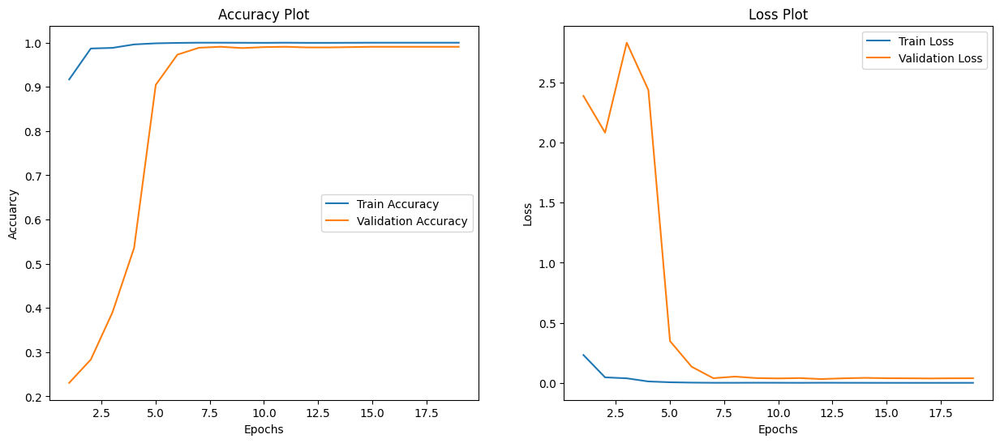

In [46]:
# figure size
plt.figure(figsize=(15,6))

# Training accuracy and validation accuracy
train_acc = history.history['accuracy']
val_acc   = history.history['val_accuracy']
epochs = range(1,20) # as best performance at epoch 19
plt.subplot(1,2,1)
plt.plot(epochs,train_acc[:19],label='Train Accuracy')
plt.plot(epochs,val_acc[:19],label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuarcy')
plt.title('Accuracy Plot')
plt.legend(loc='center right')

# Training and validation losses
train_loss = history.history['loss']
val_loss   = history.history['val_loss']
plt.subplot(1,2,2)
plt.plot(epochs,train_loss[:19],label='Train Loss')
plt.plot(epochs,val_loss[:19],label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.legend(loc='upper right')

plt.show()

### Confusion matrix plots:

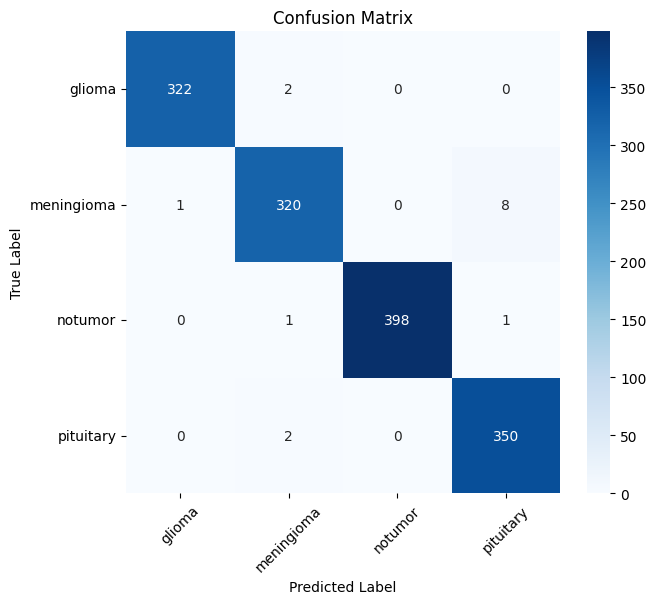

In [47]:
# Plot confusion matrix
plt.figure(figsize=(7, 6))
sns.heatmap(cnf_mtx, annot=True, fmt='d', cmap='Blues', xticklabels=img_labels, yticklabels=img_labels)
plt.xlabel('Predicted Label')
plt.xticks(rotation=45)
plt.ylabel('True Label')
plt.yticks(rotation=0)
plt.title('Confusion Matrix') 
plt.show()

# Predicting Tumor On Unseen Images:

### Image Pre-Processing:

In [48]:
# Function to perform complete image processing:
def Image_PreProcessed(img,crop=None,target_size=(224,224)):
    img = img.copy()
    if crop is not None:
        _,_,img = crop(img)
    # resize
    img = cv2.resize(img, dsize=target_size, interpolation=cv2.INTER_LANCZOS4)
    # filtering
    img = cv2.bilateralFilter(img, 2, 50,50)
    # apply colormap bone for highlight important features
    img = cv2.applyColorMap(img, cv2.COLORMAP_BONE)
    # Normalize
    img = (img/255.0).astype('float32')

    # return processed image
    return img

In [49]:
# Read images
img_dir = "/kaggle/input/brain-tumor-mri-dataset/Testing"
# Image labels
img_labels = ['glioma','meningioma','notumor','pituitary']
# Image paths
img_folders = [(os.path.join(img_dir,lab),lab) for lab in img_labels] # (folder,labels) pairs


In [50]:
img_folders

[('/kaggle/input/brain-tumor-mri-dataset/Testing/glioma', 'glioma'),
 ('/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma', 'meningioma'),
 ('/kaggle/input/brain-tumor-mri-dataset/Testing/notumor', 'notumor'),
 ('/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary', 'pituitary')]

In [51]:
# Extract 5 images from each of types
images = [(os.listdir(img_folder)[:5],lab,img_folder) for img_folder,lab in img_folders]
print(images)

[(['Te-gl_0066.jpg', 'Te-gl_0043.jpg', 'Te-gl_0166.jpg', 'Te-gl_0048.jpg', 'Te-gl_0028.jpg'], 'glioma', '/kaggle/input/brain-tumor-mri-dataset/Testing/glioma'), (['Te-me_0148.jpg', 'Te-me_0062.jpg', 'Te-me_0303.jpg', 'Te-me_0179.jpg', 'Te-me_0089.jpg'], 'meningioma', '/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma'), (['Te-no_0016.jpg', 'Te-no_0292.jpg', 'Te-no_0137.jpg', 'Te-no_0346.jpg', 'Te-no_0141.jpg'], 'notumor', '/kaggle/input/brain-tumor-mri-dataset/Testing/notumor'), (['Te-pi_0059.jpg', 'Te-pi_0024.jpg', 'Te-pi_0232.jpg', 'Te-pi_0286.jpg', 'Te-pi_0233.jpg'], 'pituitary', '/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary')]


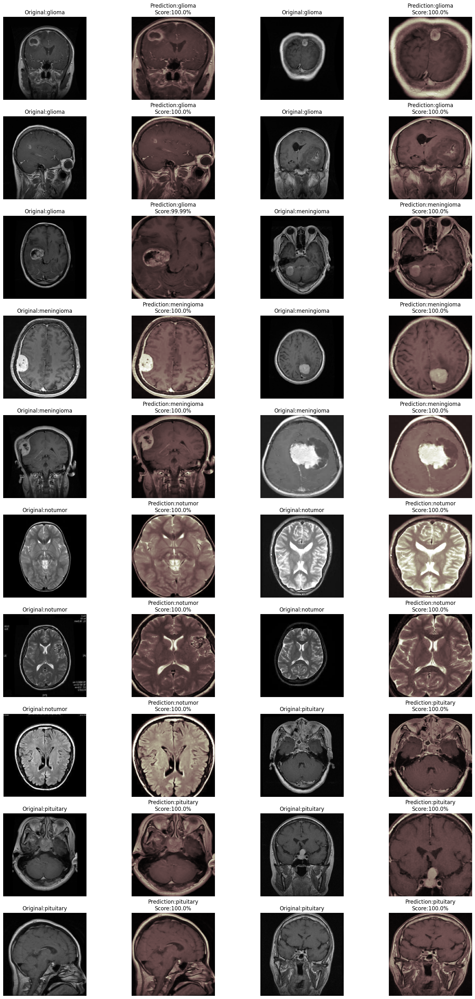

In [52]:
# predicts the tumor types on each unseen data
# plot figure
# Calculate rows and columns dynamically
n_images = 5*len(images) * 2  # Original  + predicting
cols = 4
rows = (n_images + cols - 1) // cols  # Round up to fit all images
plt.figure(figsize=(20,rows*4))
i = 1
for imgs,lab,folder in images:
    original_label = lab
    for img in imgs:
        # read image
        image_path = os.path.join(folder,img)
        image = cv2.imread(image_path)
        image = cv2.resize(image, (224,224))  # Resize to the expected input size
        # Original image
        plt.subplot(rows,cols,i)
        plt.imshow(image,cmap='gray')
        plt.title(f'Original:{original_label}')
        plt.axis('off')
        
        # Predicted type with score on processed image
        image_pro = Image_PreProcessed(image,crop=Crop_image)
        # Dynamically reshape , since target size is (1,224,224,3), 1 for batch size for single image
        target_shape = (1, *image_pro.shape)  # (1, height, width, channels)
        image_pro_re = image_pro.reshape(target_shape)
        predictions = Predicted_model.predict(image_pro_re,verbose=0)
        predicted_label = np.argmax(predictions, axis=-1)[0]  # Get the index of the highest probability
        predicted_score = np.max(predictions,axis=-1)[0]
        plt.subplot(rows,cols,i+1)
        plt.imshow(image_pro ,cmap='gray')
        plt.title(f'Prediction:{img_labels[predicted_label]}\nScore:{np.round(predicted_score*100,2)}%')
        plt.axis('off')
        i+=2
plt.show()